# Import Package

In [55]:
# Import package

import os
import cv2
import numpy as np
from skimage.feature import local_binary_pattern
import albumentations as A
import matplotlib.pyplot as plt
from sklearn import svm, metrics
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from skimage.feature import local_binary_pattern
from sklearn.preprocessing import StandardScaler
from skimage import io, color
from sklearn.decomposition import PCA
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns


## Helper

In [56]:
# Function to divide the image into patches
def extract_patches(image, patch_size=(32, 32)):
    patches = []

    # Check if the image is grayscale (2D) or color (3D)
    if len(image.shape) == 2:  # Grayscale
        h, w = image.shape
    else:  # Color image
        h, w, _ = image.shape

    # Extract patches based on patch size
    for i in range(0, h, patch_size[0]):
        for j in range(0, w, patch_size[1]):
            patch = image[i:i + patch_size[0], j:j + patch_size[1]]
            if patch.shape[0] == patch_size[0] and patch.shape[1] == patch_size[1]:
                patches.append(patch)
    return patches

# Function to extract color histograms from the image
def extract_color_histogram(image, bins=(8, 8, 8)):
    hist = cv2.calcHist([image], [0, 1, 2], None, bins, [0, 256, 0, 256, 0, 256])
    hist = cv2.normalize(hist, hist).flatten()
    return hist


# Function to extract LBP (Local Binary Pattern) as texture features
def extract_lbp_features(image, num_points=24, radius=8):
    lbp = local_binary_pattern(image, num_points, radius, method="uniform")
    (hist, _) = np.histogram(lbp.ravel(), bins=np.arange(0, num_points + 3), range=(0, num_points + 2))
    hist = hist.astype("float")
    hist /= (hist.sum() + 1e-6)  # Normalize
    return hist

# Assets

In [57]:
# Import assets

# Number 1 images
metal = []
metal_hist_list = []
organic = []
organic_hist_list = []
plastic = []
plastic_hist_list = []

# Define the root folder
root_folder = 'soal 1'

for foldername, subfolders, filenames in os.walk(root_folder):
    if 'metal' in foldername:
        current_list = metal
        current_hist_list = metal_hist_list
    elif 'organic' in foldername:
        current_list = organic
        current_hist_list = organic_hist_list
    elif 'plastic' in foldername:
        current_list = plastic
        current_hist_list = plastic_hist_list
    else:
        continue

    for filename in filenames:
        if filename.endswith('.jpg'):
            image_path = os.path.join(foldername, filename)
            image = cv2.imread(image_path)
            current_hist_list.append(image)
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            current_list.append(image)
    

# 1. Image Classification and Augmentation

## a (10) Lakukan augmentasi data pada citra RGB yang telah diberikan menggunakan 5 atau lebih metode augmentasi pilihan Anda. Buatlah citra augmented (dibebaskan jumlahnya) untuk setiap citra asli di setiap kelas. Visualisasikan beberapa citra augmented untuk setiap kelas.

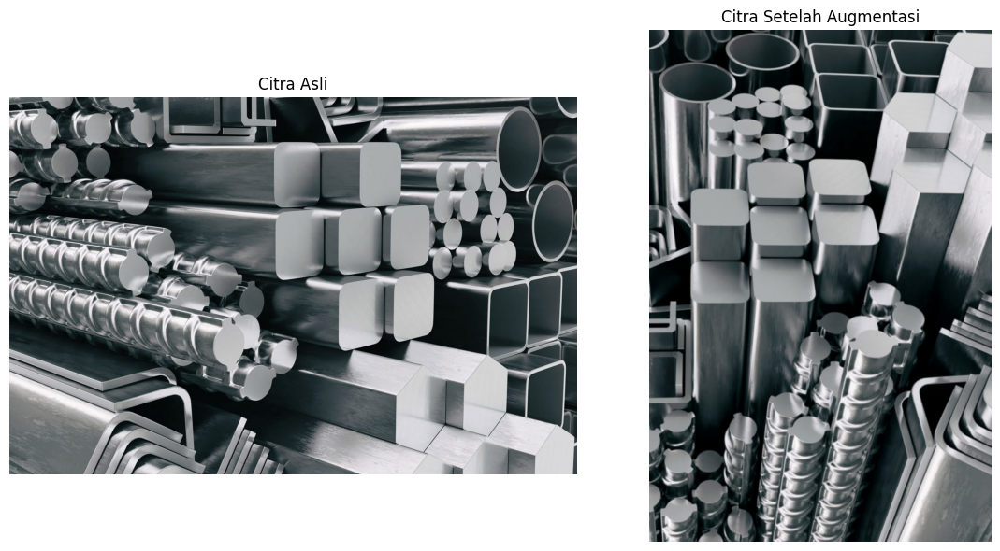

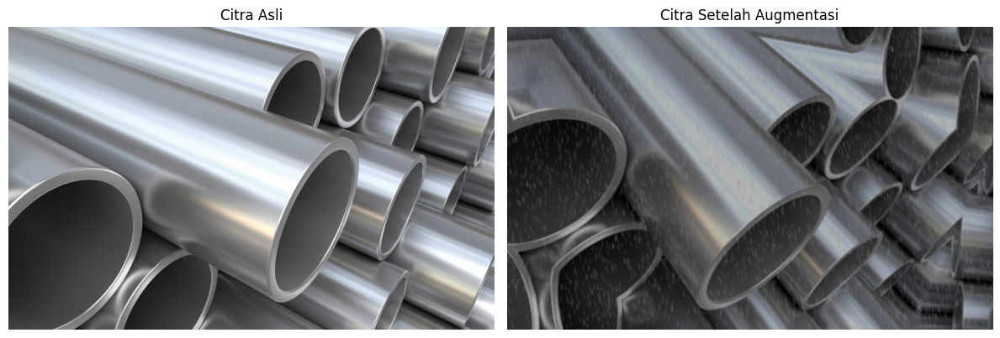

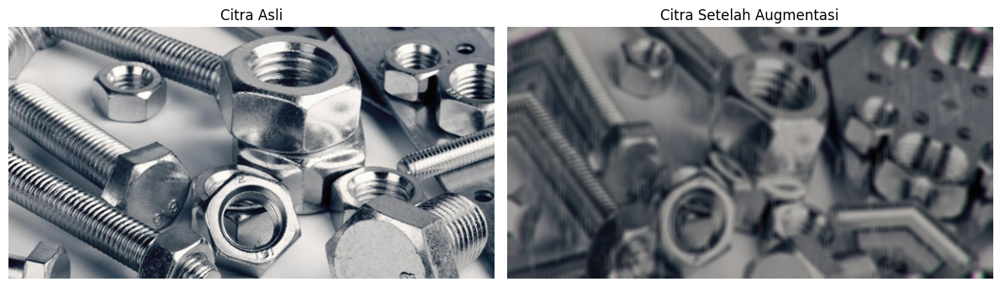

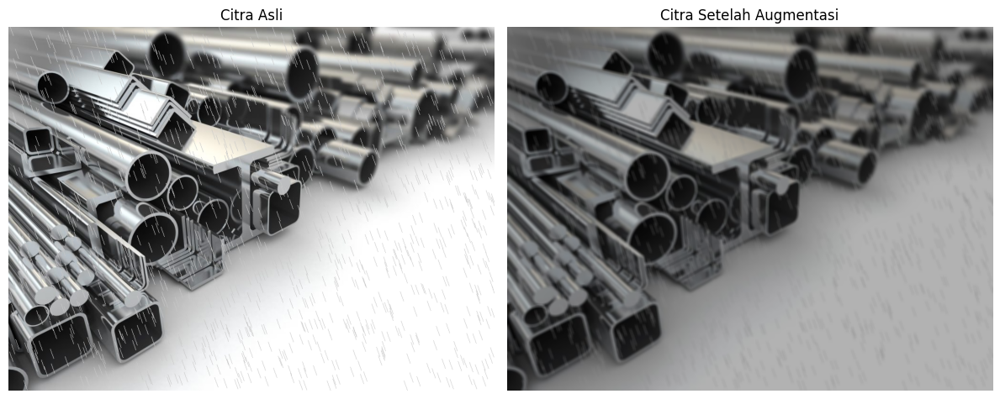

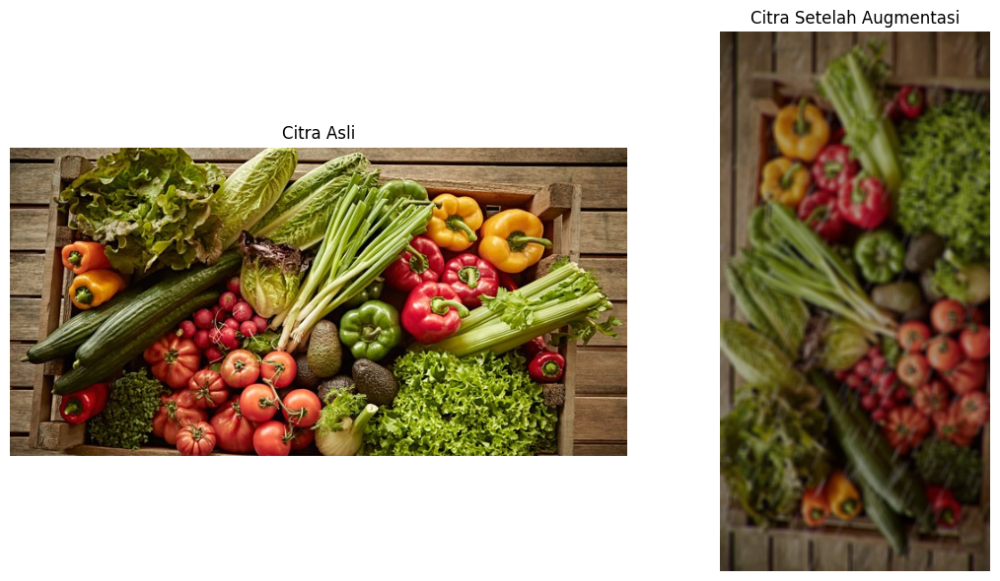

...

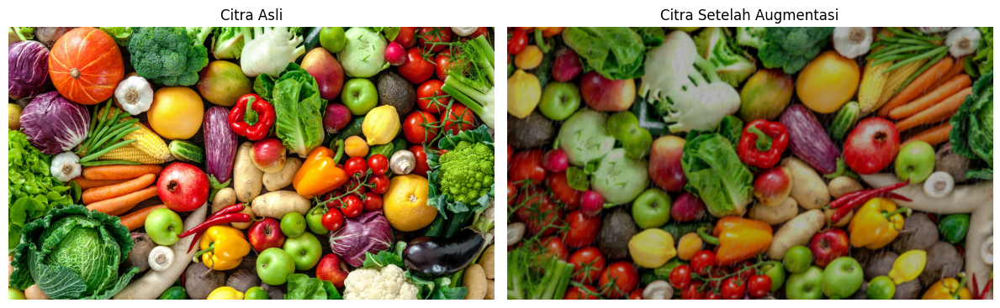

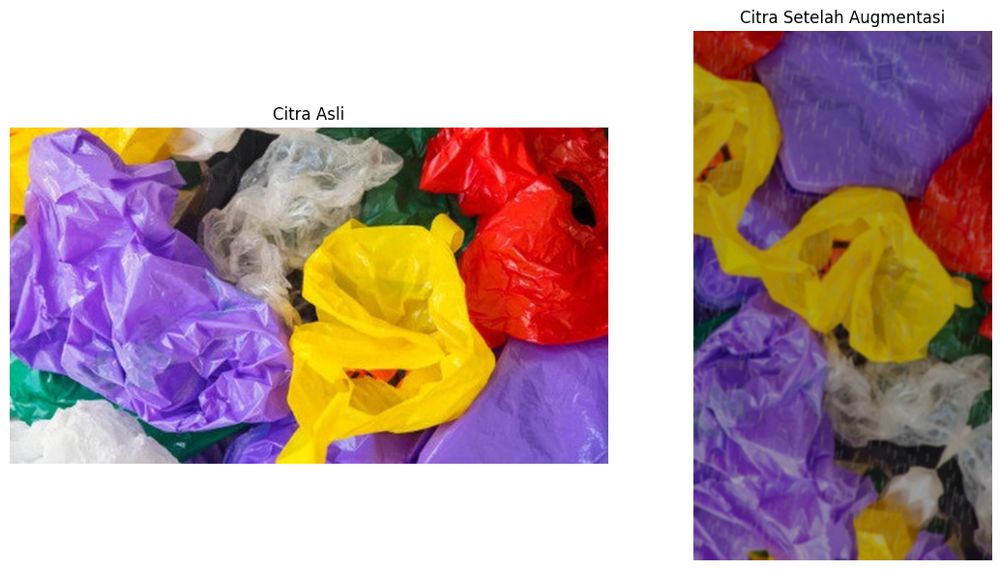

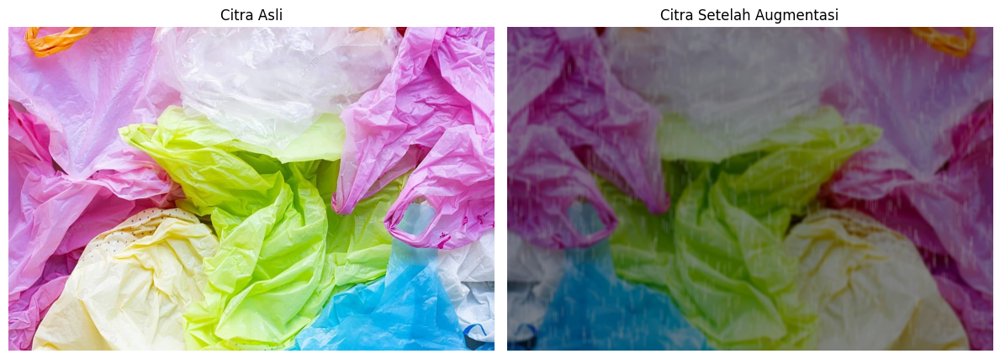

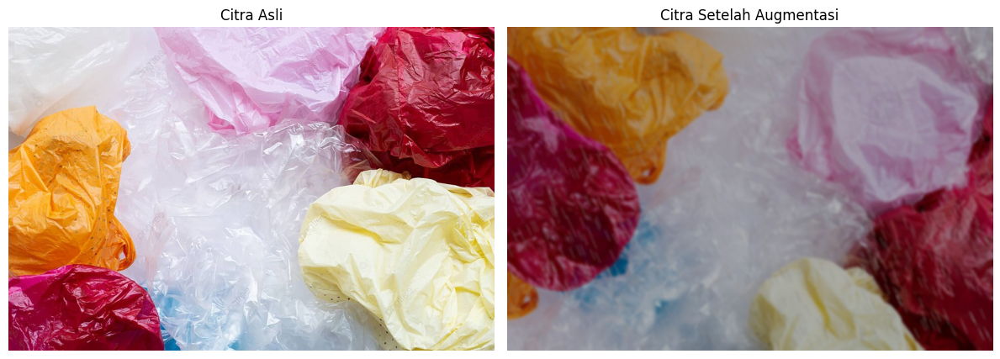

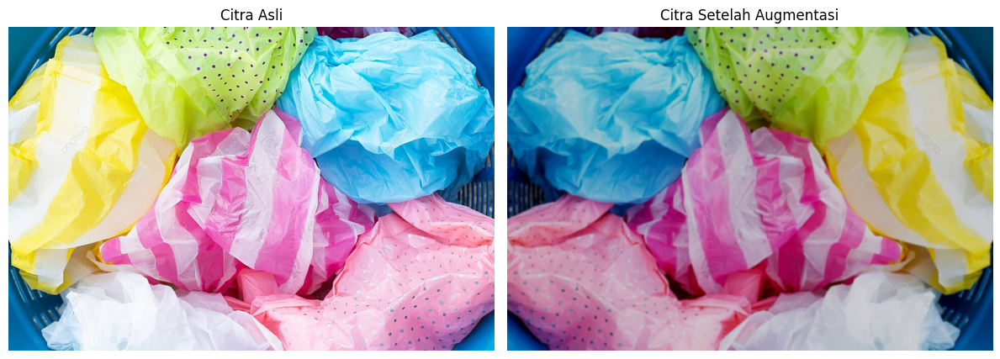

In [58]:
# YOUR CODE HERE

transform = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.RandomRotate90(p=0.5),
    A.RandomBrightnessContrast(p=0.5),
    A.ShiftScaleRotate(shift_limit=0.1, scale_limit=0.2, rotate_limit=45, p=0.5),
    A.GaussianBlur(p=0.5),
    A.RandomRain(p=0.5),
    A.ChromaticAberration(p=0.5),
])

number_of_transformation = 50
initial_metal = metal.copy()
initial_plastic = plastic.copy()
initial_organic = organic.copy()

for image in initial_metal:
    augmented = transform(image=image)
    augmented_image = augmented['image']
    
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    plt.imshow(image)
    plt.title('Citra Asli')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(augmented_image)
    plt.title('Citra Setelah Augmentasi')
    plt.axis('off')

    plt.tight_layout()
    plt.show()
    
    for idx in range(0, number_of_transformation):
        augmented = transform(image=image)
        augmented_image = augmented['image']        
        metal.append(augmented_image)
        
for image in initial_organic:
    augmented = transform(image=image)
    augmented_image = augmented['image']
    
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    plt.imshow(image)
    plt.title('Citra Asli')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(augmented_image)
    plt.title('Citra Setelah Augmentasi')
    plt.axis('off')

    plt.tight_layout()
    plt.show()
    
    for idx in range(0, number_of_transformation):
        augmented = transform(image=image)
        augmented_image = augmented['image']        
        organic.append(augmented_image)
        
for image in initial_plastic:
    augmented = transform(image=image)
    augmented_image = augmented['image']
    
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    plt.imshow(image)
    plt.title('Citra Asli')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(augmented_image)
    plt.title('Citra Setelah Augmentasi')
    plt.axis('off')

    plt.tight_layout()
    plt.show()
    
    for idx in range(0, number_of_transformation):
        augmented = transform(image=image)
        augmented_image = augmented['image']        
        plastic.append(augmented_image)
    

## b (10) Ekstrak histogram warna dari seluruh citra augmented untuk setiap kelas. Agregasikan histogram warna dari semua gambar untuk setiap kelas, sehingga menghasilkan histogram kolektif untuk setiap kelas. Visualisasikan histogram kolektif yang diekstrak dari seluruh gambar augmented untuk masing-masing kelas (metal, plastik, dan organik)

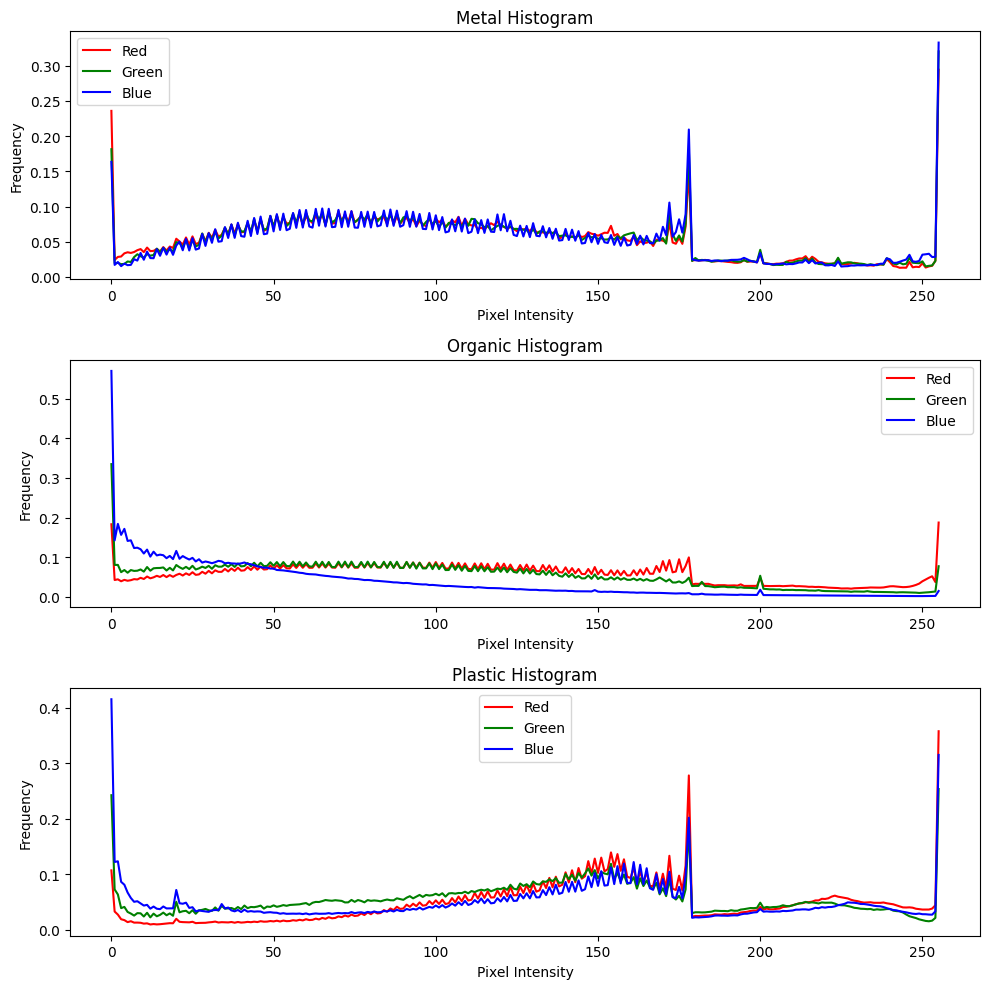

In [59]:
# YOUR CODE HERE

def aggregate_histograms(images, bins=256):
    hist_r = np.zeros(bins)
    hist_g = np.zeros(bins)
    hist_b = np.zeros(bins)
    
    for img in images:
        hist_r += cv2.calcHist([img], [0], None, [bins], [0, 256]).flatten()
        hist_g += cv2.calcHist([img], [1], None, [bins], [0, 256]).flatten()
        hist_b += cv2.calcHist([img], [2], None, [bins], [0, 256]).flatten()

    hist_r = cv2.normalize(hist_r, hist_r).flatten()
    hist_g = cv2.normalize(hist_g, hist_g).flatten()
    hist_b = cv2.normalize(hist_b, hist_b).flatten()

    return hist_r, hist_g, hist_b

# Load your image lists (already provided)
metal_hist_r, metal_hist_g, metal_hist_b = aggregate_histograms(metal)
organic_hist_r, organic_hist_g, organic_hist_b = aggregate_histograms(organic)
plastic_hist_r, plastic_hist_g, plastic_hist_b = aggregate_histograms(plastic)

# Plotting
fig, axes = plt.subplots(3, 1, figsize=(10, 10))

# Metal
axes[0].plot(metal_hist_r, color='r', label='Red')
axes[0].plot(metal_hist_g, color='g', label='Green')
axes[0].plot(metal_hist_b, color='b', label='Blue')
axes[0].set_title("Metal Histogram")
axes[0].set_xlabel("Pixel Intensity")
axes[0].set_ylabel("Frequency")
axes[0].legend()

# Organic
axes[1].plot(organic_hist_r, color='r', label='Red')
axes[1].plot(organic_hist_g, color='g', label='Green')
axes[1].plot(organic_hist_b, color='b', label='Blue')
axes[1].set_title("Organic Histogram")
axes[1].set_xlabel("Pixel Intensity")
axes[1].set_ylabel("Frequency")
axes[1].legend()

# Plastic
axes[2].plot(plastic_hist_r, color='r', label='Red')
axes[2].plot(plastic_hist_g, color='g', label='Green')
axes[2].plot(plastic_hist_b, color='b', label='Blue')
axes[2].set_title("Plastic Histogram")
axes[2].set_xlabel("Pixel Intensity")
axes[2].set_ylabel("Frequency")
axes[2].legend()

plt.tight_layout()
plt.show()

## c (5) Berdasarkan visualisasi histogram kolektif dari setiap kelas, insight apa yang dapat Anda simpulkan? Apakah setiap kelas memiliki karakteristik unik dalam distribusi warna yang membantu membedakannya dari kelas lain?

Untuk setiap histogram:
1. Metal Histogram: lebih reflektif dengan dominasi warna biru.
2. Organic Histogram: cenderung lebih bervariasi di intensitas menengah dengan warna hijau dan merah.
3. Plastic Histogram: memiliki distribusi warna yang lebih merata, menunjukkan karakteristik buatan.

Dari observasi dan histogram yang saya peroleh, berikut adalah karakteristik unik yang ditemukan dalam distribusi warna yang dapat membantu membedakan kelas lain:
1. Metal: Didominasi oleh warna biru dan refleksi yang sangat tinggi pada intensitas piksel tinggi. Hal ini kemungkinan menunjukkan sifat reflektif dari logam.
2. Organic: Memiliki distribusi warna yang menunjukkan bayangan di intensitas rendah, serta penekanan pada hijau dan merah pada intensitas menengah. Ini cocok dengan objek organik seperti tanaman.
3. Plastic: Distribusi yang lebih merata di semua saluran warna, dengan variasi yang lebih kecil, menunjukkan warna yang lebih seragam atau sintetis pada plastik.

Selanjutnya ini dapat membantu model seperti contohnya SVM untuk melakukan klasifikasi gambar yang kita punya kedalam kategori metal/plastik/organik.

## d (10) Gunakan Support Vector Machine (SVM) untuk melakukan klasifikasi berdasarkan fitur histogram warna yang telah diekstraksi pada langkah (b). Evaluasi performa model dengan menghitung classification report dan visualisasikan confusion matrix.

Classification Report:
              precision    recall  f1-score   support

       Metal       0.92      0.98      0.95        45
     Organic       1.00      0.93      0.96        41
     Plastic       0.97      0.97      0.97        37

    accuracy                           0.96       123
   macro avg       0.96      0.96      0.96       123
weighted avg       0.96      0.96      0.96       123



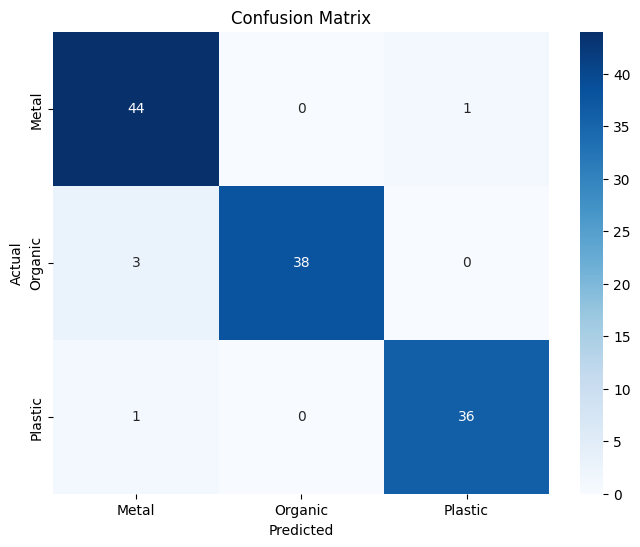

In [60]:
# YOUR CODE HERE

def extract_histogram_features(images, bins=256):
    features = []
    for img in images:
        hist_r = cv2.calcHist([img], [0], None, [bins], [0, 256]).flatten()
        hist_g = cv2.calcHist([img], [1], None, [bins], [0, 256]).flatten()
        hist_b = cv2.calcHist([img], [2], None, [bins], [0, 256]).flatten()
        hist_r = cv2.normalize(hist_r, hist_r).flatten()
        hist_g = cv2.normalize(hist_g, hist_g).flatten()
        hist_b = cv2.normalize(hist_b, hist_b).flatten()
        features.append(np.concatenate([hist_r, hist_g, hist_b]))
    return np.array(features)

# Ekstraksi fitur dari setiap kelas
metal_features = extract_histogram_features(metal)
organic_features = extract_histogram_features(organic)
plastic_features = extract_histogram_features(plastic)

labels = np.concatenate([
    np.zeros(len(metal_features)),
    np.ones(len(organic_features)),
    np.full(len(plastic_features), 2)
])

features = np.concatenate([metal_features, organic_features, plastic_features])

X_train, X_test, y_train, y_test = train_test_split(features, labels, test_size=0.2, random_state=42)

# Latih model SVM
svm = SVC(kernel='linear')
svm.fit(X_train, y_train)

y_pred = svm.predict(X_test)

print("Classification Report:")
print(classification_report(y_test, y_pred, target_names=["Metal", "Organic", "Plastic"], labels=[0, 1, 2]))

# Confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=["Metal", "Organic", "Plastic"], yticklabels=["Metal", "Organic", "Plastic"])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

## e (5) Jelaskan hasil klasifikasi dan apakah model mampu membedakan setiap kelas dengan baik. Apakah fitur histogram warna sudah cukup efektif untuk membedakan kelas, atau diperlukan fitur tambahan untuk meningkatkan akurasi?

Dari classification report yang ditampilkan, model berbasis histogram warna menunjukkan performa yang cukup baik dengan akurasi 96%. Namun, terdapat beberapa kesalahan pada semua kelas. Hal ini mungkin disebabkan oleh kesamaan pola warna antara beberapa kelas dan juga transformasi yang dilakukan. Secara keseluruhan model mampu membedakan setiap kelas dengan baik. Akan tetapi apabila sampel kita perbanyak dan variasi warna yang lebih banyak, menurut saya fitur histogram warna saja tidak cukup untuk membedakan kelas. Hal ini karena histogram warna hanya memberikan informasi distribusi warna secara keseluruhan tanpa memperhatikan pola atau tekstur dari objek.

Oleh karena itu, diperlukan fitur tambahan untuk mencegah hal ini agar dapat meningkatkan akurasi, contoh fitur tambahan yang dapat dilakukan:
1. Tekstur: Menggunakan fitur berbasis tekstur seperti GLCM (Gray Level Co-occurrence Matrix) dapat membantu membedakan pola permukaan material.
2. Edge Detection: Deteksi tepi atau fitur bentuk dapat digunakan untuk lebih membedakan objek berdasarkan bentuk geometris mereka.
3. Color Moments: Fitur statistik seperti mean, variance, dan skewness pada distribusi warna dapat memberikan informasi tambahan yang lebih kaya dibanding histogram.

Meskipun histogram warna sudah cukup efektif, penggunaan kombinasi fitur tambahan dapat meningkatkan performa terutama untuk membedakan kelas dengan pola warna yang mirip seperti Metal dan Plastic.

# 2. Hough Transformation

## a) (15) Gunakan Hough Transform untuk mengekstrak garis-garis vertikal dan horizontal pada citra gedung yang telah dimodifikasi.

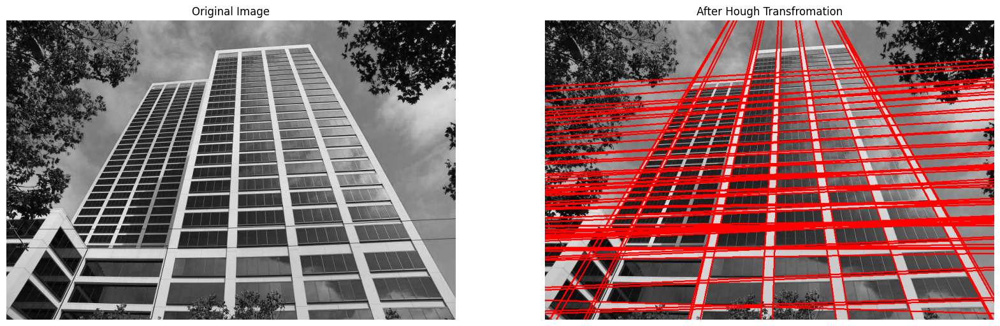

In [61]:
# YOUR CODE HERE

img = io.imread('gedung.jpg')

if len(img.shape) == 2:  
    img = color.gray2rgb(img)

original_image = np.copy(img)

gray = (color.rgb2gray(img) * 255).astype(np.uint8)


# find all of the edges using canny
edges = cv2.Canny(gray, 285, 450, apertureSize=3)
lines = cv2.HoughLines(edges, 1, np.pi/210, 200)


# plotting line
for line in lines:
   for rho,theta in line:
       a = np.cos(theta)
       b = np.sin(theta)
       x0 = a*rho
       y0 = b*rho
       x1 = int(x0 + 1000*(-b))
       y1 = int(y0 + 1000*(a))
       x2 = int(x0 - 1000*(-b))
       y2 = int(y0 - 1000*(a))
       cv2.line(img, (x1,y1), (x2,y2), (255,0,0), 2)


# Show image
plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
plt.title('Original Image')
plt.imshow(original_image)
plt.axis('off')
plt.subplot(1,2,2)
plt.title('After Hough Transfromation')
plt.imshow(img,)
plt.axis('off')
plt.show()

## b) (15) Ceritakan proses yang Anda lakukan untuk mendapatkan hasil akhir, serta metode-metode yang digunakan dalam deteksi garis pada citra yang telah dimodifikasi. Jelaskan kendala yang mungkin terjadi dan bagaimana cara Anda mengatasinya.

**Proses yang dilakukan**

1. Membaca dan memproses citra asli, disini karena gambar hanya memiliki satu channel, saya mengubah terlebih dahulu gambar dari grayscale menjadi RGB agar nanti dapat di convert dari 3 kanal menjadi 1 kanal (grayscale kembali) agar konsisten.
2. Mengonversi gambar ke grayscale, seperti yang disebutkan sebelumnya, saya mengonversi gambar ke grayscale agar dapat diolah lebih lanjut.
3. Deteksi tepi menggunakan algoritma Canny. Algoritma deteksi tepi Canny digunakan untuk menemukan batas-batas yang kuat dalam gambar. Parameter yang digunakan dalam fungsi cv2.Canny() menentukan ambang batas rendah dan tinggi, yaitu 285 dan 450, yang mengatur sensitivitas deteksi tepi.
4. Menggunakan Hough Transform untuk mendeteksi garis. Hough Transform digunakan untuk mendeteksi garis lurus dalam gambar. Fungsi cv2.HoughLinesP() digunakan untuk mendeteksi garis lurus dalam gambar. Parameter yang digunakan dalam fungsi ini adalah rho, theta, dan threshold. Rho adalah resolusi jarak dalam piksel, theta adalah resolusi sudut dalam radian, dan threshold adalah ambang batas jumlah titik yang diperlukan untuk membentuk garis. Parameter yang saya gunakan: rho = 1, theta = np.pi/210, threshold = 200. Threshold ini mengatur jumlah minimum titik yang harus ada di garis yang terdeteksi agar garis tersebut dianggap valid.
5. Menggambar garis hasil deteksi, hasil dari HoughLines() adalah garis-garis yang diwakili oleh parameter rho (jarak) dan theta (sudut)
6. Gambar asli dan gambar hasil deteksi garis ditampilkan berdampingan menggunakan plt.subplot() untuk memudahkan perbandingan.

**Metode yang digunakan dalam deteksi garis pada citra yang telah dimodifikasi**
1. Deteksi Tepi Canny: Teknik ini mendeteksi perubahan intensitas di sebuah gambar yang diinterpretasikan sebagai tepi atau batas antara objek. Proses ini penting karena hanya tepi-tepi yang signifikan yang akan dianalisis lebih lanjut oleh algoritma Hough Transform.

2. Transformasi Hough: Teknik ini berbasis transformasi parameter yang dapat digunakan untuk mendeteksi bentuk geometris seperti garis atau lingkaran dalam sebuah citra. Dalam kasus ini, transformasi Hough digunakan untuk mendeteksi garis lurus. Setiap garis dalam gambar memiliki parameter rho dan theta, yang kemudian diproyeksikan ke dalam ruang parameter.

**Kendala yang Terjadi**
1. Jumlah garis yang terdeteksi terlalu banyak: Salah satu kendala terjadi pada saya adalah terlalu banyaknya garis yang terdeteksi, sehingga gambar hasil deteksi menjadi penuh dengan garis. Oleh karena itu saya mengubah threshold dalam Hough Transform agar disesuaikan dengan menaikkan nilainya sehingga hanya garis yang lebih signifikan yang akan terdeteksi. Di samping itu, bisa dilakukan penyaringan lebih lanjut terhadap garis yang terdeteksi berdasarkan panjang atau sudutnya. Pada kasus ini, saya mengubah threshold menjadi 200 agar hanya garis yang lebih signifikan yang terdeteksi. Selanjutnya saya juga mengubah sudut theta menjadi np.pi/210 agar garis yang terdeteksi lebih lurus.

2. Noise yang disebabkan parameter canny: Seperti yang disebutkan sebelumnya, parameter canny sendiri mendeteksi perubahan intensitas disebuah gambar. Akan tetapi, apabila parameter yang kita gunakan terlalu kecil thresholdnya, maka intensitas gambar yang dipilih dapat menjadi cukup buruk. Hal ini disebabkan karena noise yang terlalu banyak pada gambar. Oleh karena itu, kita perlu menyesuaikan parameter canny agar noise yang dihasilkan dapat diminimalisir. Awalny saya mendapatkan hasil yang cukup baik pada threshold 200 dan 600. Akan tetapi untuk mendapatkan detail dan juga menghapus noise lebih lanjut saya menggunakan threshold 285 dan 450 agar dapat mendapatkan hasil yang cukup baik.

# 3. Feature Selection dan Dimensional Reduction

## a) (20) Gunakan PCA pada citra di atas untuk mengurangi dimensi dari fitur-fitur yang diekstrak menjadi 2 komponen utama. Ekstrak fitur dari citra daun tersebut menggunakan kombinasi histogram warna dan feature extraction  menggunakan Local Binary Pattern (LBP). Setelah itu, terapkan PCA untuk mereduksi dimensi fitur menjadi 2 komponen utama, dan akhirnya visualisasikan hasil PCA dalam bentuk scatter plot untuk menunjukkan bagaimana PCA menangkap pola-pola terpenting dalam data. (Kami telah membuat fungsi helper.py untuk membantu soal ini)

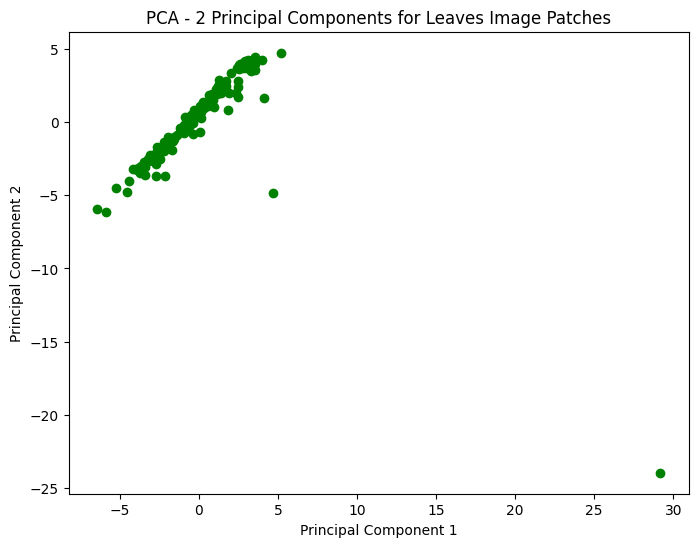

Explained Variance by PCA: [0.12443125 0.10835876]


In [62]:
# YOUR CODE HERE

image_path = 'daun.jpg'
image = cv2.imread(image_path)

gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

patches = extract_patches(image, patch_size=(32, 32))
gray_patches = extract_patches(gray_image, patch_size=(32, 32))

features = []
for patch, gray_patch in zip(patches, gray_patches):
    color_feat = extract_color_histogram(patch)
    lbp_feat = extract_lbp_features(gray_patch)
    combined_features = np.hstack([color_feat, lbp_feat])
    features.append(combined_features)
    
features = np.array(features)

scaler = StandardScaler()
features_scaled = scaler.fit_transform(features)

# Apply PCA to reduce to 2 components
pca = PCA(n_components=2)
features_pca = pca.fit_transform(features_scaled)

plt.figure(figsize=(8, 6))
plt.scatter(features_pca[:, 0], features_pca[:, 1], c='g', marker='o')
plt.title('PCA - 2 Principal Components for Leaves Image Patches')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()

print(f"Explained Variance by PCA: {pca.explained_variance_ratio_}")




## b) (5) Berdasarkan hasil Dimensionality Reduction, jelaskan bagaimana PCA mengurangi dimensi dan mengapa dua komponen utama pertama menangkap sebagian besar varians dalam data. Berikan analisis mengenai bagaimana distribusi data dalam ruang 2D yang dihasilkan dari PCA. Jelaskan apakah pola yang terdeteksi di ruang 2D tersebut bisa membantu dalam mengenali karakteristik utama dari citra daun.



Tujuan PCA adalah untuk mengurangi dimensi data sambil mempertahankan sebanyak mungkin variasi dalam dataset. Akan tetapi terdapat beberapa cara PCA mengurangi dimensi. Berikut adalah caranya:
1. Standardisasi Data: Data fitur awal distandardisasi menggunakan StandardScaler, yang memastikan setiap fitur memiliki mean 0 dan standar deviasi 1, agar semua fitur berada pada skala yang sama.
2. Covariance Matrix: PCA menghitung matriks kovarian untuk melihat bagaimana fitur-fitur berkorelasi satu sama lain.
3. Eigenvectors & Eigenvalues: Matriks kovarian tersebut diuraikan menjadi eigenvector dan eigenvalue. Eigenvector mewakili arah baru di mana data paling tersebar (principal components), dan eigenvalue menunjukkan jumlah variansi yang dijelaskan oleh setiap arah ini.
4. Transformasi Data: Data kemudian diproyeksikan ke ruang baru yang diwakili oleh eigenvector dengan eigenvalue terbesar. Untuk kasus ini saya memilih 2 principal components, yang berarti data direduksi ke dua dimensi, yang menangkap sebanyak mungkin varians.

Untuk representasi data PCA yang diperoleh adalah [0.12443125, 0.10835876], yaitu berarti Principal Component 1 (PC1) menjelaskan 12.44% dari total varians dalam data.
Principal Component 2 (PC2) menjelaskan 10.84% dari total varians dalam data. Secara total, dua komponen utama ini hanya menjelaskan sekitar 23.28% dari varians total data. Ini berarti bahwa mayoritas informasi dalam data masih tersebar di dimensi lain (komponen selain dua komponen ini).

Dalam PCA, komponen pertama selalu menangkap jumlah variansi terbesar, dan setiap komponen berikutnya menangkap variansi yang tersisa, tetapi dalam jumlah yang lebih kecil. Semakin banyak komponen yang ditambahkan, semakin kecil variansi yang bisa dijelaskan oleh masing-masing komponen karena PCA bekerja dengan mengurutkan variansi dari yang terbesar ke terkecil

**Apakah Dua Komponen Utama Menangkap Sebagian Besar Varians?**

Dengan explained variance sebesar 23.28%, dua komponen utama pertama tidak menangkap sebagian besar varians dalam data karena masih ada sekitar 76.72% varians yang tersisa yang belum dijelaskan oleh dua komponen ini. Alasan mengapa dua komponen utama tidak menangkap sebagian besar varians mungkin disebabkan oleh data yang sangat multidimensional ataupun variasa yang mungkin tersebar di lebih banyak komponen utama lainnya.

**Analisis Distribusi Data di Ruang 2D**
1. Data tampaknya sangat terkonsentrasi di satu daerah kecil (sekitar nilai-nilai kecil pada Principal Component 1 dan 2), dengan beberapa outlier yang menyebar jauh dari cluster utama.
2. Outliers: Ada beberapa titik data yang jauh dari kumpulan utama, yang mungkin menunjukkan outlier atau patch gambar yang memiliki karakteristik berbeda secara signifikan dari yang lain.
3. Cluster utama: Konsentrasi titik yang sangat rapat menunjukkan bahwa sebagian besar patch gambar daun memiliki pola fitur yang cukup mirip setelah diubah ke dalam ruang PCA.

**Pola yang terdeteksi di ruang 2D untuk mengenai karakteristik dari citra daun**:
Berdasarkan hasil PCA, titik-titik pada ruang 2D menunjukkan bahwa mayoritas patch gambar daun memiliki karakteristik fitur yang serupa dan cenderung berkumpul di satu area. Outliers yang jauh dari cluster utama mungkin mengindikasikan perbedaan karakteristik di beberapa bagian daun, seperti warna yang lebih gelap, variasi tekstur yang lebih kasar, atau pencahayaan yang berbeda.

Dapat dilihat bahwa hal ini benar karena daun pada gambar memiliki gambaran yang mirip/serupa. Oleh karena itu pola banyak titik yang berkumpul dalam satu area menjelaskan pola-pola yang mirip tersebut.


## c) (5) Jelaskan perbedaan antara Dimensionality Reduction dan Feature Selection. Berikan contoh situasi di mana Dimensionality Reduction lebih tepat digunakan dan kapan Feature Selection  lebih sesuai, terutama dalam konteks pemrosesan data citra. Jelaskan perbedaan utama dalam tujuan dan cara kerja kedua teknik ini.

Dimensionality Reduction:
- Tujuan: Mengurangi jumlah dimensi (fitur) data dengan mentransformasikan fitur asli ke dalam representasi baru, yang sering kali merupakan kombinasi dari fitur-fitur asli, sehingga dimensi baru tetap menangkap sebagian besar informasi penting dari data. Contohnya seperti PCA atau TSNE
- Contoh nyata:
    - PCA (Principal Component Analysis): Menghasilkan kombinasi linier dari fitur asli dan menurunkan dimensi data dengan tetap mempertahankan sebagian besar varians.
    - t-SNE: Mengubah dimensi data menjadi representasi dengan dimensi lebih rendah (biasanya 2 atau 3 dimensi) yang membantu memvisualisasikan struktur data.

Feature Selection:
- Tujuan: Mengurangi jumlah dimensi data dengan memilih **fitur-fitur paling penting** dari fitur yang sudah ada, tanpa melakukan transformasi atau perubahan terhadap fitur asli.
- Contoh nyata:
    - Filter Methods: Menggunakan skor statistik seperti korelasi atau chi-square untuk memilih fitur terbaik.   

Contoh kasus penggunaan
- Dimensionality Reduction: Saat menganalisis pola tekstur atau warna dari sebuah citra daun, menggunakan PCA untuk mereduksi fitur warna atau tekstur dari ribuan patch citra menjadi beberapa komponen utama dapat memberikan pemahaman visual dan pola penting dalam data yang sulit dilihat dalam dimensi tinggi.
- Feature Selection: Dalam citra medis, di mana setiap fitur mewakili pengukuran spesifik (seperti ukuran tumor, kepadatan tulang, dll.), feature selection akan lebih sesuai. kita ingin memilih beberapa fitur terbaik yang berkaitan dengan hasil diagnosis tanpa mengubah makna fitur tersebut.

Perbedaan Utama:
1. Dari cara kerja: Dimensionality Reduction menghasilkan fitur baru sebagai kombinasi fitur asli sedangkan Feature Selection memilih subset dari fitur asli tanpa perubahan
2. Dari intepretasi: Pada PCA, fitur baru biasanya tidak mudah untuk diintepretasikan karena sifatnya yang menggabungkan fitur tersebut, akan tetapi pada feature selection fitur asli tetap dipertahankan.
3. Penggunaan: Dimensionality Reduction digunakan saat data memiliki dimensi sangat tinggi dan banyak fitur yang berkorelasi. Disisi lain, feature selection digunakan saat fitur asli sudah bermakna dan relevansi perlu dipilih.
4. Tujuan: Pada dimensionality reduction, kegunaannya adalah untuk mereduksi dimensi sambil mempertahankan informasi maksimal akan tetapi feature selection menyederhanakan model dengan memilih fitur paling penting